# Detection d'anomalies sur moteurs turbofan

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt 
from sklearn.ensemble import IsolationForest
from sklearn.decomposition import PCA
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')

### Chargement du dataset

In [2]:
df = pd.read_csv('train_FD001.txt', sep='\s+')
df.head()

,1,1.1,-0.0007,-0.0004,100.0,518.67,641.82,1589.70,1400.60,14.62,...,521.66,2388.02,8138.62,8.4195,0.03,392,2388,100.00,39.06,23.4190
0,1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,...,522.28,2388.07,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236
1,1,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,...,522.42,2388.03,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442
2,1,4,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,14.62,...,522.86,2388.08,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739
3,1,5,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,...,522.19,2388.04,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044
4,1,6,-0.0043,-0.0001,100.0,518.67,642.10,1584.47,1398.37,14.62,...,521.68,2388.03,8132.85,8.4108,0.03,391,2388,100.0,38.98,23.3669


In [3]:
columns = ['engine_id', 'cycle', 'setting1', 'setting2', 'setting3'] + [f"sensor{i}" for i in range(1, 22)]
df.columns = columns

In [4]:
df.head()

,engine_id,cycle,setting1,setting2,setting3,sensor1,sensor2,sensor3,sensor4,sensor5,...,sensor12,sensor13,sensor14,sensor15,sensor16,sensor17,sensor18,sensor19,sensor20,sensor21
0,1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,...,522.28,2388.07,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236
1,1,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,...,522.42,2388.03,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442
2,1,4,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,14.62,...,522.86,2388.08,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739
3,1,5,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,...,522.19,2388.04,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044
4,1,6,-0.0043,-0.0001,100.0,518.67,642.10,1584.47,1398.37,14.62,...,521.68,2388.03,8132.85,8.4108,0.03,391,2388,100.0,38.98,23.3669


In [5]:
data = df.copy()
# forme
data.shape

(20630, 26)

In [6]:
# Nombre d'engines
data['engine_id'].unique().sum()

np.int64(5050)

**Nous avons 5050 engines**

In [7]:
# Nombre de cycle par engines
cycle_by_engin = data.groupby('engine_id')['cycle'].max()

In [8]:
cycle_by_engin

engine_id
1      192
2      287
3      179
4      189
5      269
      ... 
96     336
97     202
98     156
99     185
100    200
Name: cycle, Length: 100, dtype: int64

In [9]:
fig = px.histogram(x= cycle_by_engin,
                   title='Cycle par engine')
fig.update_layout(width=650, height=650)
fig.show()

In [10]:
# Nombre et noms des colonnes
data.columns

Index(['engine_id', 'cycle', 'setting1', 'setting2', 'setting3', 'sensor1',
       'sensor2', 'sensor3', 'sensor4', 'sensor5', 'sensor6', 'sensor7',
       'sensor8', 'sensor9', 'sensor10', 'sensor11', 'sensor12', 'sensor13',
       'sensor14', 'sensor15', 'sensor16', 'sensor17', 'sensor18', 'sensor19',
       'sensor20', 'sensor21'],
      dtype='object')

In [11]:
print(f"Nous avons {data.columns.value_counts().sum()} colonnes")

Nous avons 26 colonnes


In [12]:
# Corrélations des capteurs
data_2 = data.drop(['engine_id', 'cycle'], axis=1)
feature = data_2.copy()
feature.corr()

,setting1,setting2,setting3,sensor1,sensor2,sensor3,sensor4,sensor5,sensor6,sensor7,...,sensor12,sensor13,sensor14,sensor15,sensor16,sensor17,sensor18,sensor19,sensor20,sensor21
setting1,1.000000,0.011640,NaN,NaN,0.009004,-0.005653,0.009530,NaN,-0.001338,-0.009420,...,-0.001486,0.002302,-0.004474,0.007643,NaN,0.002587,NaN,NaN,-0.005692,-0.014541
setting2,0.011640,1.000000,NaN,NaN,0.007152,0.009059,0.014612,NaN,0.014365,-0.016605,...,-0.010901,0.018087,-0.006329,0.014117,NaN,0.012229,NaN,NaN,-0.010465,-0.007767
setting3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
sensor1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
sensor2,0.009004,0.007152,NaN,NaN,1.000000,0.602642,0.714938,NaN,0.132264,-0.702115,...,-0.724605,0.661770,0.179743,0.675979,NaN,0.629875,NaN,NaN,-0.661805,-0.668022
sensor3,-0.005653,0.009059,NaN,NaN,0.602642,1.000000,0.678421,NaN,0.116040,-0.664609,...,-0.680307,0.600973,0.237136,0.639923,NaN,0.600021,NaN,NaN,-0.625961,-0.633915
sensor4,0.009530,0.014612,NaN,NaN,0.714938,0.678421,1.000000,NaN,0.150490,-0.793120,...,-0.815595,0.745147,0.190740,0.758454,NaN,0.703489,NaN,NaN,-0.748055,-0.745181
sensor5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
sensor6,-0.001338,0.014365,NaN,NaN,0.132264,0.116040,0.150490,NaN,1.000000,-0.155733,...,-0.155887,0.158288,-0.002110,0.149047,NaN,0.130817,NaN,NaN,-0.141434,-0.137432
sensor7,-0.009420,-0.016605,NaN,NaN,-0.702115,-0.664609,-0.793120,NaN,-0.155733,1.000000,...,0.812721,-0.764598,-0.110042,-0.747048,NaN,-0.692882,NaN,NaN,0.736145,0.737430


In [13]:
from sklearn.feature_selection import VarianceThreshold
selector = VarianceThreshold()
feature = selector.fit_transform(feature)

In [14]:
feature = pd.DataFrame(feature, columns = data_2.drop(['setting3', 'sensor1', 'sensor5', 
                                                     'sensor10', 'sensor16', 'sensor18',
                                                     'sensor19'], axis=1).columns)
feature.head()

,setting1,setting2,sensor2,sensor3,sensor4,sensor6,sensor7,sensor8,sensor9,sensor11,sensor12,sensor13,sensor14,sensor15,sensor17,sensor20,sensor21
0,0.0019,-0.0003,642.15,1591.82,1403.14,21.61,553.75,2388.04,9044.07,47.49,522.28,2388.07,8131.49,8.4318,392.0,39.00,23.4236
1,-0.0043,0.0003,642.35,1587.99,1404.20,21.61,554.26,2388.08,9052.94,47.27,522.42,2388.03,8133.23,8.4178,390.0,38.95,23.3442
2,0.0007,0.0000,642.35,1582.79,1401.87,21.61,554.45,2388.11,9049.48,47.13,522.86,2388.08,8133.83,8.3682,392.0,38.88,23.3739
3,-0.0019,-0.0002,642.37,1582.85,1406.22,21.61,554.00,2388.06,9055.15,47.28,522.19,2388.04,8133.80,8.4294,393.0,38.90,23.4044
4,-0.0043,-0.0001,642.10,1584.47,1398.37,21.61,554.67,2388.02,9049.68,47.16,521.68,2388.03,8132.85,8.4108,391.0,38.98,23.3669


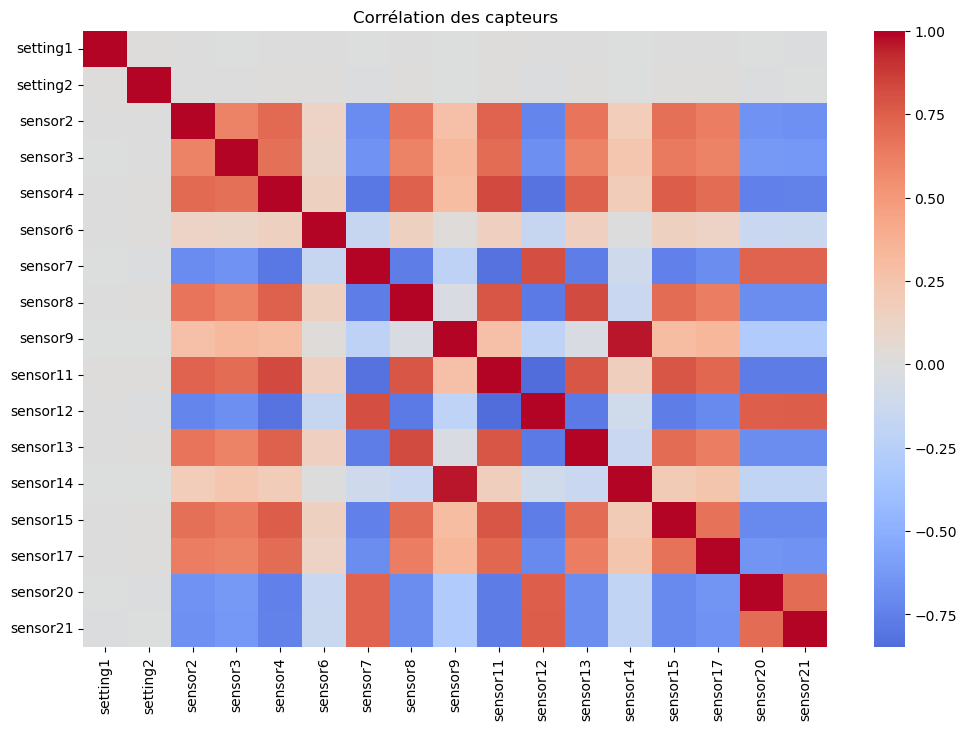

In [15]:
# Matrice de corrélation
plt.figure(figsize=(12, 8))
sns.heatmap(feature.corr(), cmap='coolwarm', center=0)
plt.title('Corrélation des capteurs')
plt.show()

In [16]:
# Valeurs manquantes
data.isna().sum().sum()

np.int64(0)

**Pas de valeurs manquantes**

In [17]:
# Doublons
data.duplicated().sum()

np.int64(0)

**Pas de doublons**

### Preprocessing

In [18]:
data_2.head()

,setting1,setting2,setting3,sensor1,sensor2,sensor3,sensor4,sensor5,sensor6,sensor7,...,sensor12,sensor13,sensor14,sensor15,sensor16,sensor17,sensor18,sensor19,sensor20,sensor21
0,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,21.61,553.75,...,522.28,2388.07,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236
1,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,21.61,554.26,...,522.42,2388.03,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442
2,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,14.62,21.61,554.45,...,522.86,2388.08,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739
3,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,21.61,554.00,...,522.19,2388.04,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044
4,-0.0043,-0.0001,100.0,518.67,642.10,1584.47,1398.37,14.62,21.61,554.67,...,521.68,2388.03,8132.85,8.4108,0.03,391,2388,100.0,38.98,23.3669


In [19]:
# Standardisation
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data_2)
data_scaled = pd.DataFrame(data_scaled, columns=data_2.columns)

In [20]:
data_scaled.head()

,setting1,setting2,setting3,sensor1,sensor2,sensor3,sensor4,sensor5,sensor6,sensor7,...,sensor12,sensor13,sensor14,sensor15,sensor16,sensor17,sensor18,sensor19,sensor20,sensor21
0,0.872688,-1.031809,0.0,0.0,-1.061914,0.211517,-0.643769,-1.776357e-15,0.141687,0.431987,...,1.174890,-0.363698,-0.642843,-0.275877,-1.040834e-17,-0.781740,0.0,0.0,1.016613,1.236993
1,-1.961847,1.015632,0.0,0.0,-0.661928,-0.413162,-0.525996,-1.776357e-15,0.141687,1.008216,...,1.364708,-0.919895,-0.551630,-0.649163,-1.040834e-17,-2.073113,0.0,0.0,0.739971,0.503486
2,0.324068,-0.008089,0.0,0.0,-0.661928,-1.261291,-0.784873,-1.776357e-15,0.141687,1.222889,...,1.961276,-0.224649,-0.520177,-1.971664,-1.040834e-17,-0.781740,0.0,0.0,0.352671,0.777858
3,-0.864608,-0.690569,0.0,0.0,-0.621929,-1.251505,-0.301562,-1.776357e-15,0.141687,0.714452,...,1.052865,-0.780846,-0.521750,-0.339869,-1.040834e-17,-0.136054,0.0,0.0,0.463328,1.059621
4,-1.961847,-0.349329,0.0,0.0,-1.161910,-0.987280,-1.173744,-1.776357e-15,0.141687,1.471459,...,0.361388,-0.919895,-0.571550,-0.835807,-1.040834e-17,-1.427426,0.0,0.0,0.905956,0.713191


### PCA

In [21]:
pca_test = PCA()

In [22]:
pca_test.fit(data_scaled)

PCA()

In [23]:
pca_test.n_components_

24

In [24]:
pca_test.explained_variance_ratio_

array([5.30977890e-01, 1.23460092e-01, 5.95477063e-02, 5.83640947e-02,
       5.65920913e-02, 2.43363257e-02, 2.16595731e-02, 2.04902746e-02,
       1.80032566e-02, 1.70447033e-02, 1.50223931e-02, 1.21268109e-02,
       1.15257616e-02, 1.03865656e-02, 1.01459099e-02, 8.59493290e-03,
       1.72161820e-03, 4.25471354e-18, 8.21185416e-34, 2.05516354e-50,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00])

In [25]:
variance = pd.DataFrame(pca_test.explained_variance_ratio_, columns=['Variance'])
variance['CP'] = [f"PC{i+1}" for i in range(24)]
variance

,Variance,CP
0,5.309779e-01,PC1
1,1.234601e-01,PC2
2,5.954771e-02,PC3
3,5.836409e-02,PC4
4,5.659209e-02,PC5
5,2.433633e-02,PC6
6,2.165957e-02,PC7
7,2.049027e-02,PC8
8,1.800326e-02,PC9
9,1.704470e-02,PC10


In [26]:
np.cumsum(pca_test.explained_variance_ratio_)

array([0.53097789, 0.65443798, 0.71398569, 0.77234978, 0.82894187,
       0.8532782 , 0.87493777, 0.89542805, 0.9134313 , 0.93047601,
       0.9454984 , 0.95762521, 0.96915097, 0.97953754, 0.98968345,
       0.99827838, 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        ])

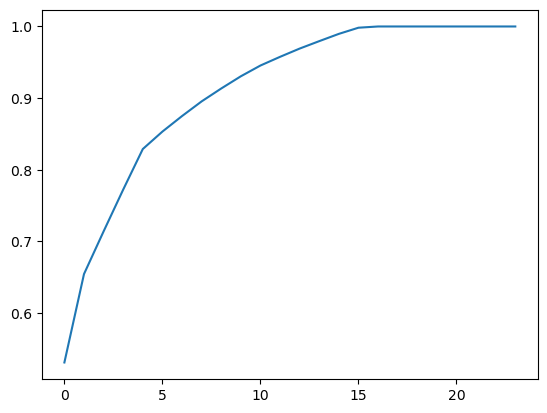

In [27]:
plt.plot(np.cumsum(pca_test.explained_variance_ratio_))

**Gardons 12 composantes**

In [28]:
pca = PCA(n_components=12)
pca.fit(data_scaled)

PCA(n_components=12)

In [29]:
# PCA loadings
loadings = pd.DataFrame(
    pca.components_.T,
    columns=[f"PC{i+1}" for i in range(pca.n_components_)])
loadings

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12
0,2.375941e-03,-5.830053e-03,6.704268e-01,7.236878e-01,1.611731e-01,1.775321e-02,8.664257e-03,3.299519e-03,9.965463e-03,2.201569e-03,-6.029827e-03,6.631897e-03
1,5.204787e-03,-1.386438e-02,7.285154e-01,-6.024223e-01,-3.255515e-01,-7.631893e-05,-6.852103e-03,2.451101e-03,-3.648562e-03,-5.399091e-03,2.697083e-03,2.100648e-03
2,0.000000e+00,1.387779e-17,-2.775558e-17,2.775558e-17,2.775558e-17,-6.661338e-16,1.110223e-16,3.330669e-16,2.220446e-16,2.775558e-16,1.665335e-16,-1.332268e-15
3,0.000000e+00,1.110223e-16,-5.551115e-17,5.551115e-17,2.775558e-17,-1.110223e-16,-1.804112e-16,-1.110223e-16,-2.775558e-17,2.775558e-17,-4.163336e-17,-1.942890e-16
4,2.727385e-01,1.832212e-02,-4.272702e-03,1.581705e-02,-1.704146e-02,-1.886999e-01,-5.560569e-01,7.357454e-01,7.550259e-02,-9.216249e-02,1.427159e-01,-4.049598e-02
5,2.596038e-01,7.743050e-02,-1.630226e-02,-2.171506e-03,-3.145686e-02,9.335667e-01,8.277981e-02,1.670457e-01,4.894892e-02,-5.495528e-02,1.136317e-01,-7.519578e-03
6,3.005860e-01,1.047570e-02,1.455718e-03,8.049928e-03,-1.645080e-02,-3.499936e-02,-3.131224e-02,-9.295666e-02,1.596830e-02,6.746146e-02,-3.142624e-01,3.518244e-01
7,-1.101420e-32,4.694723e-33,9.470074e-31,-1.636163e-30,3.356839e-30,1.399584e-30,-1.249001e-16,-1.387779e-17,1.249001e-16,1.040834e-16,8.326673e-17,-2.775558e-17
8,6.235617e-02,-4.794952e-02,1.368162e-01,-3.345864e-01,9.287481e-01,1.730377e-02,-1.568637e-03,9.513983e-03,-4.369975e-03,-9.897165e-03,2.441441e-03,2.519752e-03
9,-2.978545e-01,5.160135e-02,-1.551994e-03,-6.515356e-03,1.552282e-02,2.897866e-02,-1.037480e-02,9.234675e-02,1.361997e-02,-5.919546e-02,3.561732e-01,8.446248e-01


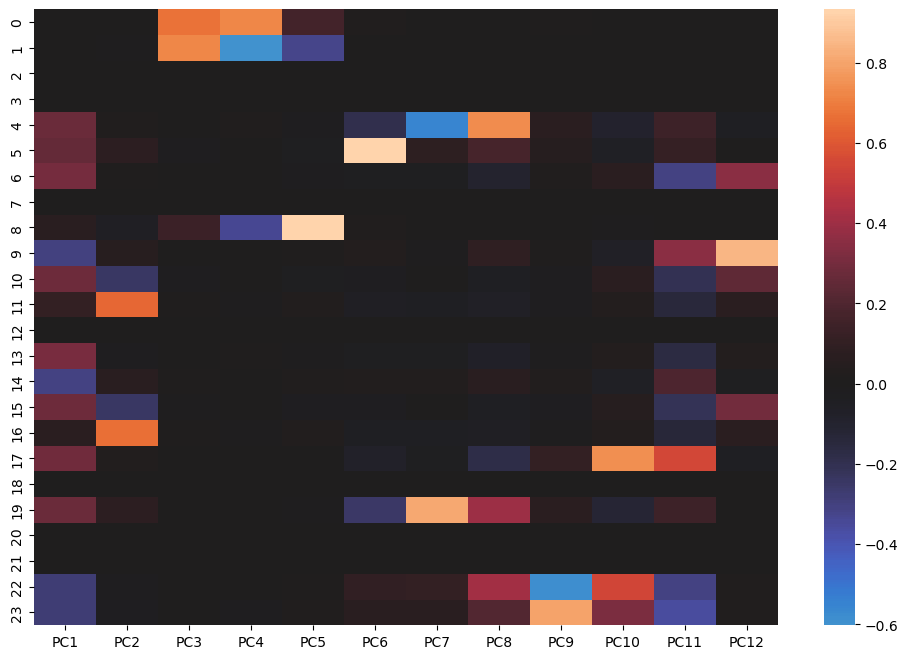

In [30]:
plt.figure(figsize=(12,8))
sns.heatmap(loadings, center=0)
plt.show()

In [31]:
data_pca = pca.transform(data_scaled)
data_pca = pd.DataFrame(data_pca, columns=[f"PC{i+1}" 
                                           for i in range(pca.n_components_)])
data_pca.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12
0,-2.363784,-0.786871,-0.132752,1.153828,0.702356,0.976340,0.301919,-0.020980,0.316046,0.656969,-0.071299,-0.215060
1,-2.978802,-0.552520,-0.529509,-2.124646,-0.375670,0.572523,-1.121992,-0.461920,-0.254946,0.096245,0.163532,0.264717
2,-3.384271,-0.843851,0.255518,0.134570,0.338052,-0.398895,-0.050257,0.126884,0.116112,-1.127336,-0.329881,0.692441
3,-2.428438,-0.363310,-1.024763,-0.306778,0.352633,-0.732373,0.355087,0.068202,0.488090,0.226000,0.169246,0.083813
4,-3.667072,-0.490507,-1.513675,-1.325818,0.117444,0.065553,-0.312874,-0.413088,-0.227860,0.030013,0.332284,0.259625


### Detection d'anomalies

In [32]:
iso = IsolationForest(n_estimators=300,
                      contamination=0.02,
                      random_state=0)
iso.fit(data_pca)

IsolationForest(contamination=0.02, n_estimators=300, random_state=0)

In [33]:
pred = iso.predict(data_pca)
score = iso.decision_function(data_pca)

In [34]:
pred[0:10]

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1])

**Les dix premières prédictions**

In [35]:
score[0:10]

array([0.12323186, 0.09261554, 0.1217308 , 0.14712732, 0.12595758,
       0.12950505, 0.1042051 , 0.11336328, 0.08338061, 0.11529182])

**Les dix premiers scores d'anomalies**

### Reconstruction du dataset final

In [36]:
df

,engine_id,cycle,setting1,setting2,setting3,sensor1,sensor2,sensor3,sensor4,sensor5,...,sensor12,sensor13,sensor14,sensor15,sensor16,sensor17,sensor18,sensor19,sensor20,sensor21
0,1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,...,522.28,2388.07,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236
1,1,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,...,522.42,2388.03,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442
2,1,4,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,14.62,...,522.86,2388.08,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739
3,1,5,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,...,522.19,2388.04,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044
4,1,6,-0.0043,-0.0001,100.0,518.67,642.10,1584.47,1398.37,14.62,...,521.68,2388.03,8132.85,8.4108,0.03,391,2388,100.0,38.98,23.3669
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20625,100,196,-0.0004,-0.0003,100.0,518.67,643.49,1597.98,1428.63,14.62,...,519.49,2388.26,8137.60,8.4956,0.03,397,2388,100.0,38.49,22.9735
20626,100,197,-0.0016,-0.0005,100.0,518.67,643.54,1604.50,1433.58,14.62,...,519.68,2388.22,8136.50,8.5139,0.03,395,2388,100.0,38.30,23.1594
20627,100,198,0.0004,0.0000,100.0,518.67,643.42,1602.46,1428.18,14.62,...,520.01,2388.24,8141.05,8.5646,0.03,398,2388,100.0,38.44,22.9333
20628,100,199,-0.0011,0.0003,100.0,518.67,643.23,1605.26,1426.53,14.62,...,519.67,2388.23,8139.29,8.5389,0.03,395,2388,100.0,38.29,23.0640


In [37]:
# Rajout du score et des anomalies 
df['anomaly'] = pred
df['anomaly_score'] = score
df['anomaly'] = df['anomaly'].map({1:'normal', -1:'anomalie'}) 

In [38]:
df.head()

,engine_id,cycle,setting1,setting2,setting3,sensor1,sensor2,sensor3,sensor4,sensor5,...,sensor14,sensor15,sensor16,sensor17,sensor18,sensor19,sensor20,sensor21,anomaly,anomaly_score
0,1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,...,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236,normal,0.123232
1,1,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,...,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442,normal,0.092616
2,1,4,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,14.62,...,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739,normal,0.121731
3,1,5,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,...,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044,normal,0.147127
4,1,6,-0.0043,-0.0001,100.0,518.67,642.10,1584.47,1398.37,14.62,...,8132.85,8.4108,0.03,391,2388,100.0,38.98,23.3669,normal,0.125958


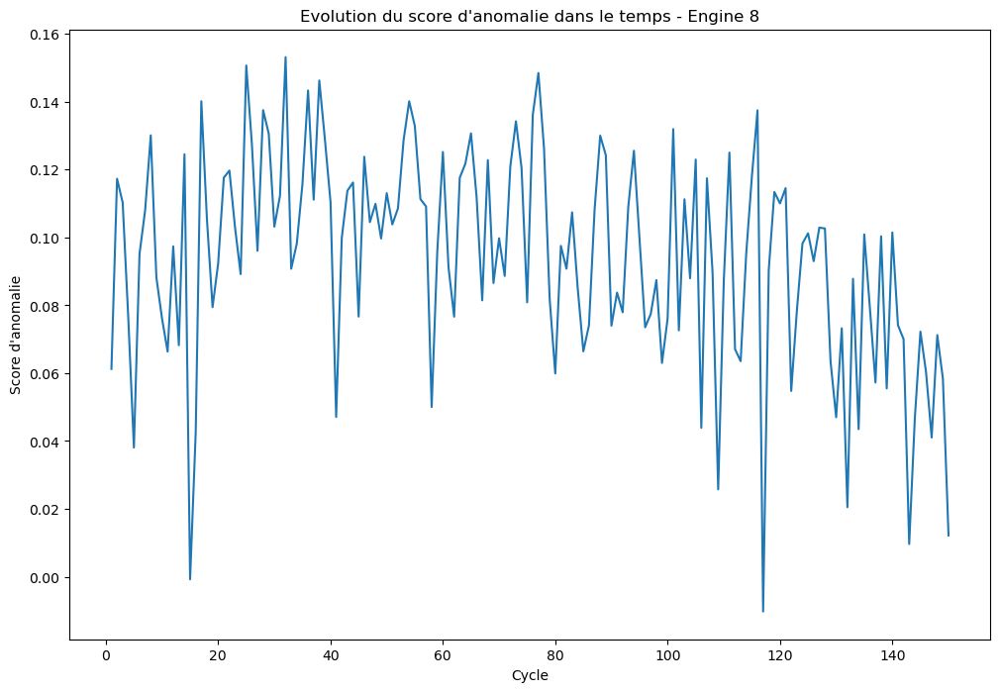

In [39]:
# Evolution des anomalies pour un moteur choisie
def engine(k):
    
    engine = k
    df_engine = df[df['engine_id'] == engine]
    plt.figure(figsize=(12,8))
    plt.plot(df_engine['cycle'], df_engine['anomaly_score'])
    plt.xlabel("Cycle")
    plt.ylabel("Score d'anomalie")
    plt.title(f"Evolution du score d'anomalie dans le temps - Engine {engine}")
    plt.show()
engine(8)

**Pas d'anomalies sur ce moteur**

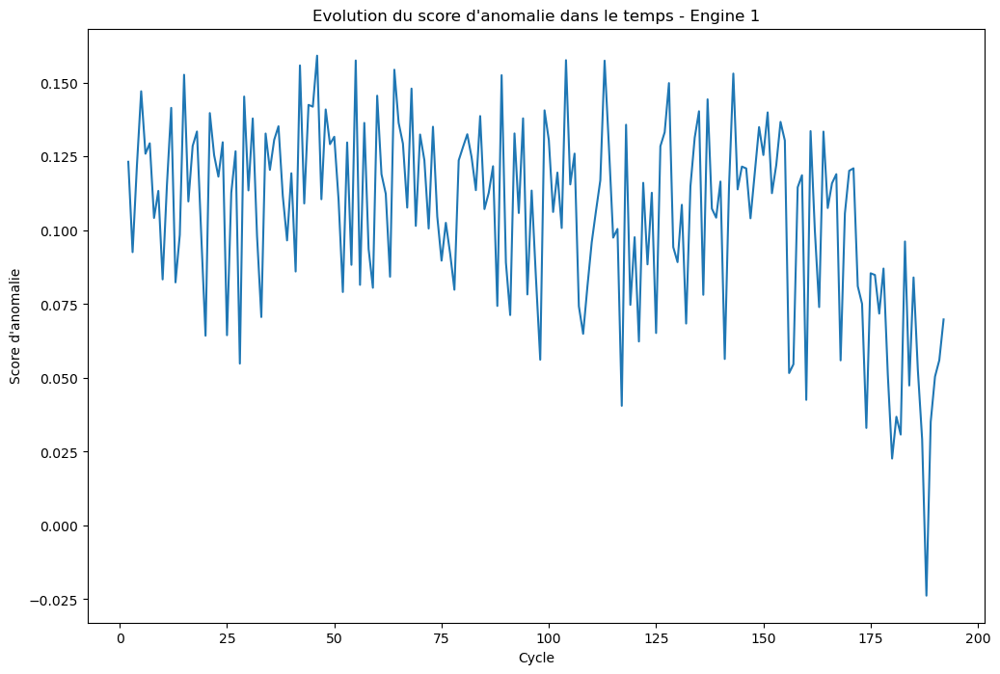

In [40]:
engine(1)

**Nous constatons une anomalie à partir du 188ème cycle de cette machine**

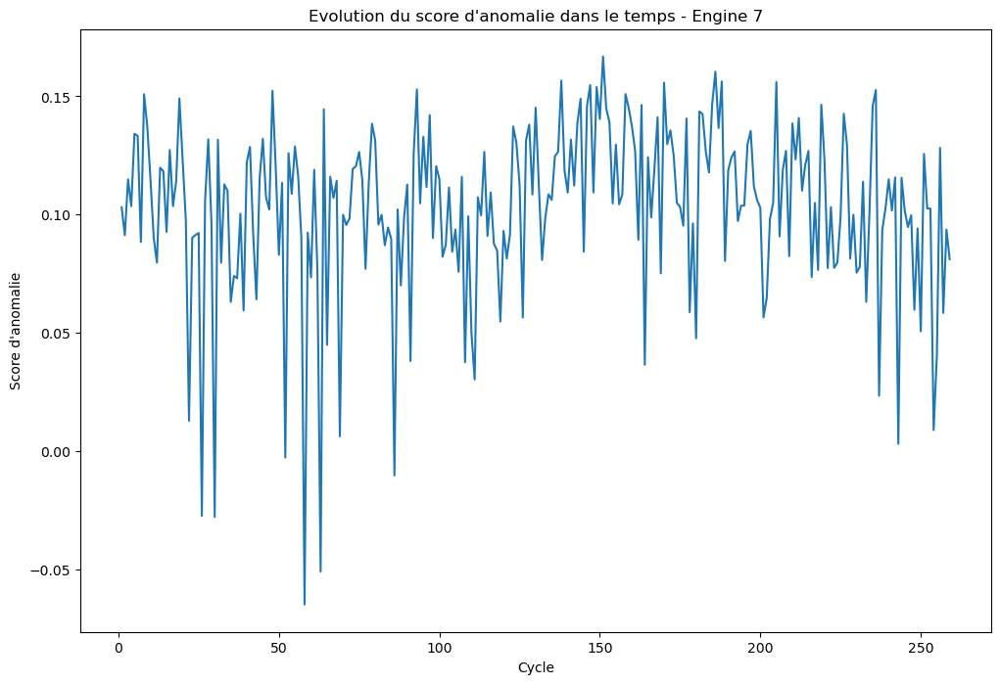

In [41]:
engine(7)

**Nous constatons également plusieurs anomalies dans les premiers cycles**

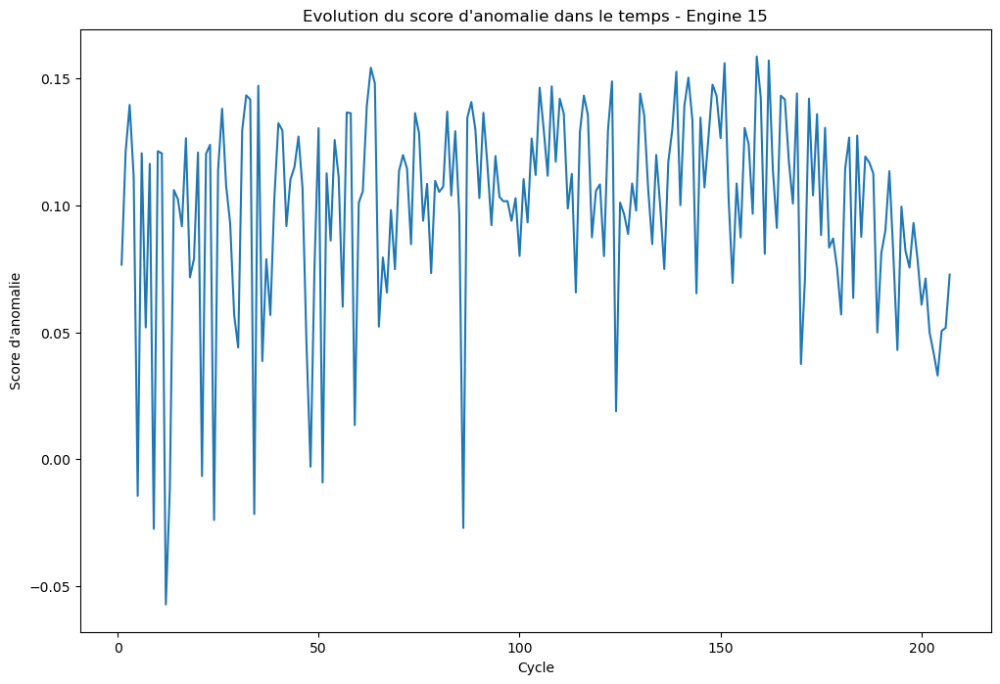

In [42]:
engine(15)

In [43]:
# graphique des capteurs dans le temps 
def time_series(engine_choice, sensor_choice):
    df_engine  = df[df['engine_id'] == engine_choice]
    df_anomalie = df[df['anomaly'] == 'anomalie']
    plt.figure(figsize=(12,8))
    sns.lineplot(data = df_engine,
                 x='cycle',
                 y=sensor_choice,
                 color='steelblue',
                 linewidth=2,
                 label='Valeurs normales')
    plt.scatter(df_anomalie['cycle'], 
                df_anomalie[sensor_choice],
                color='red',
                s=60,
                label='Anomalies')
    plt.title(f"Evolution du capteur {sensor_choice} dans le temps - Moteur {engine_choice}", fontsize=14, weight='bold')
    plt.xlabel='cycle'
    plt.ylabel(f"Valeur du capteur {sensor_choice}")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

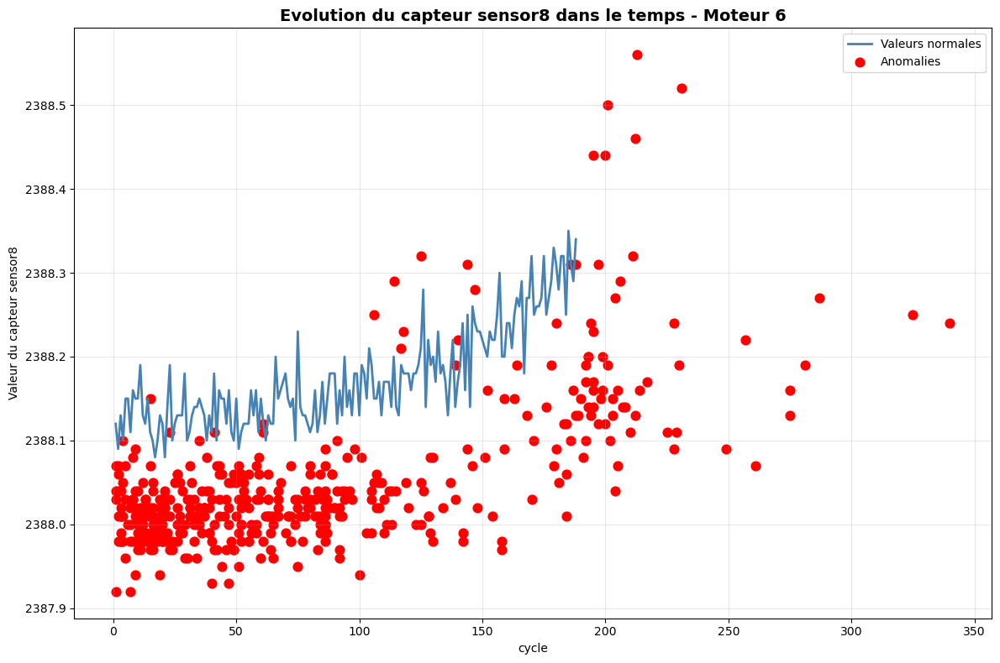

In [44]:
time_series(engine_choice=6, sensor_choice='sensor8')

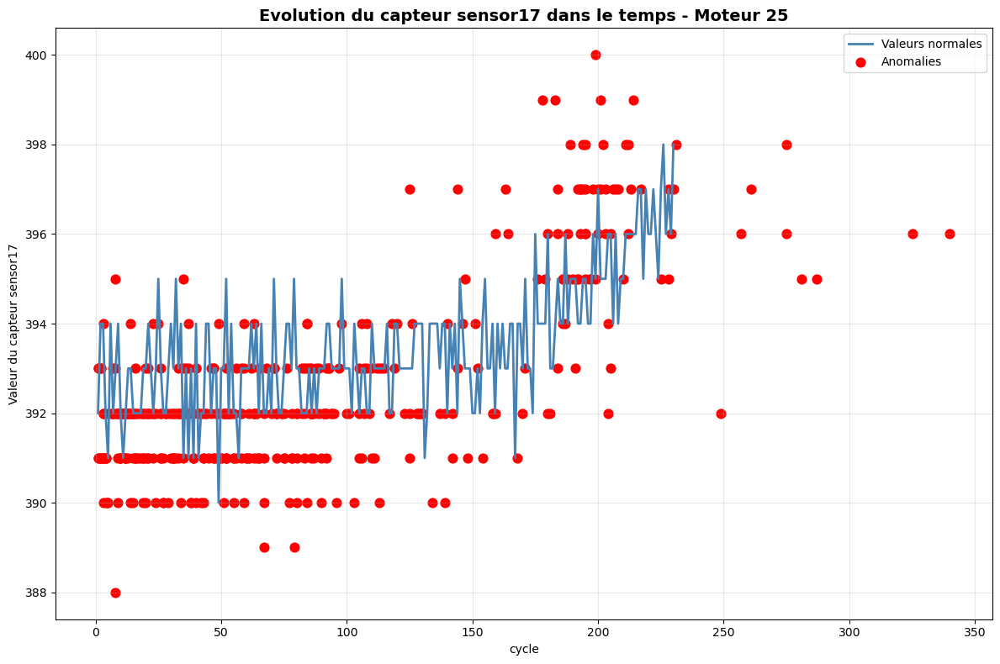

In [45]:
time_series(25, 'sensor17')

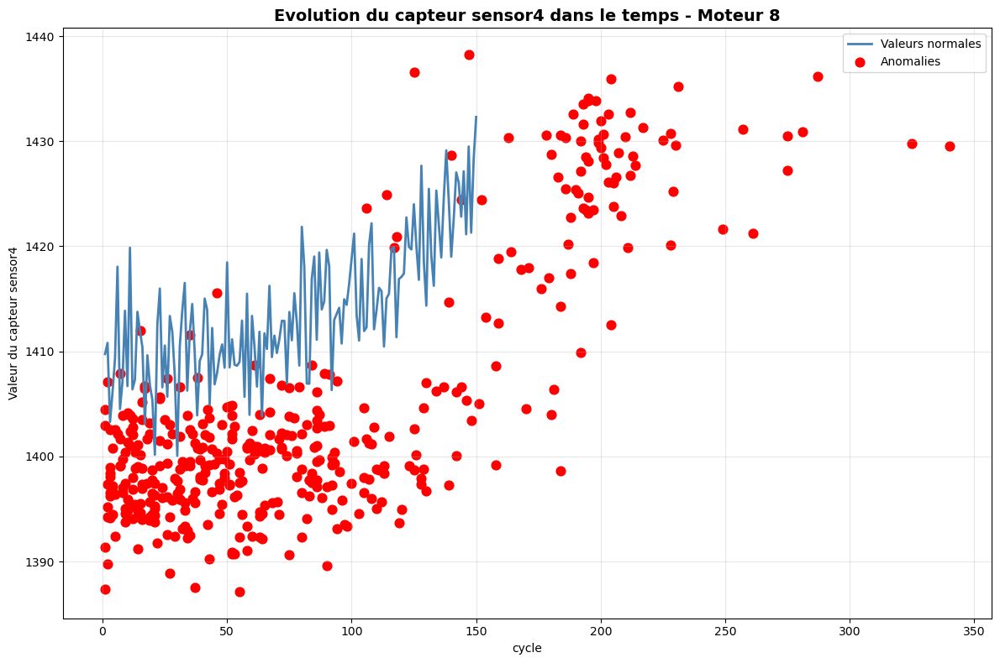

In [46]:
time_series(8, 'sensor4')

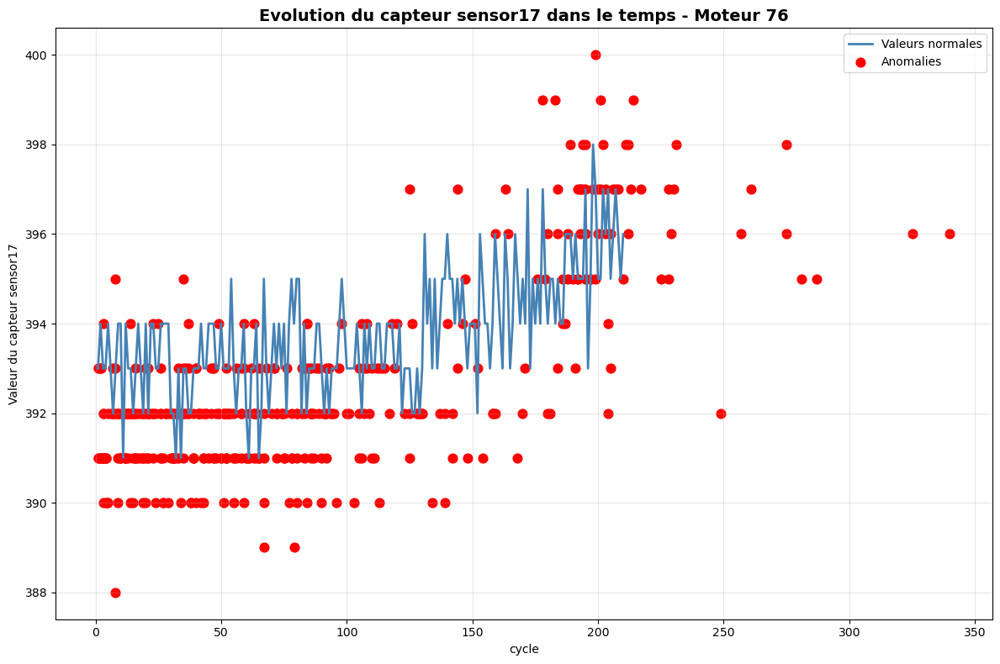

In [53]:
time_series(76, 'sensor17')

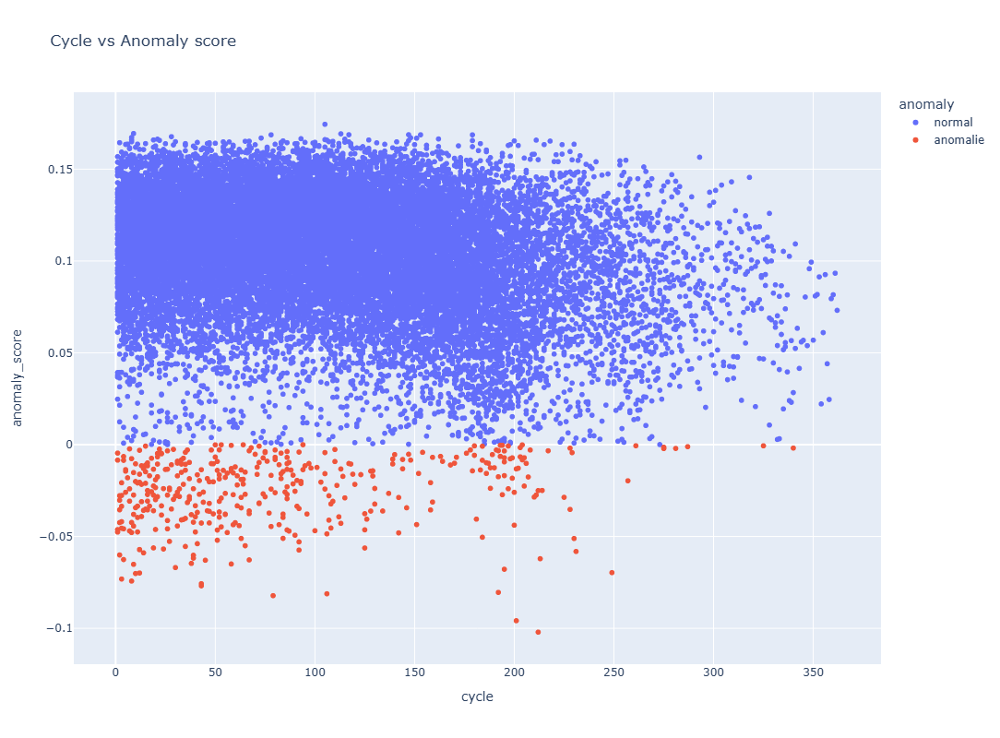

In [47]:
# Graphique score d'anomalies vs cycle 
fig = px.scatter(data_frame=df,
                 x='cycle',
                 y='anomaly_score',
                 title='Cycle vs Anomaly score',
                 color='anomaly')
fig.update_layout(width=800, height=800)
fig.show()

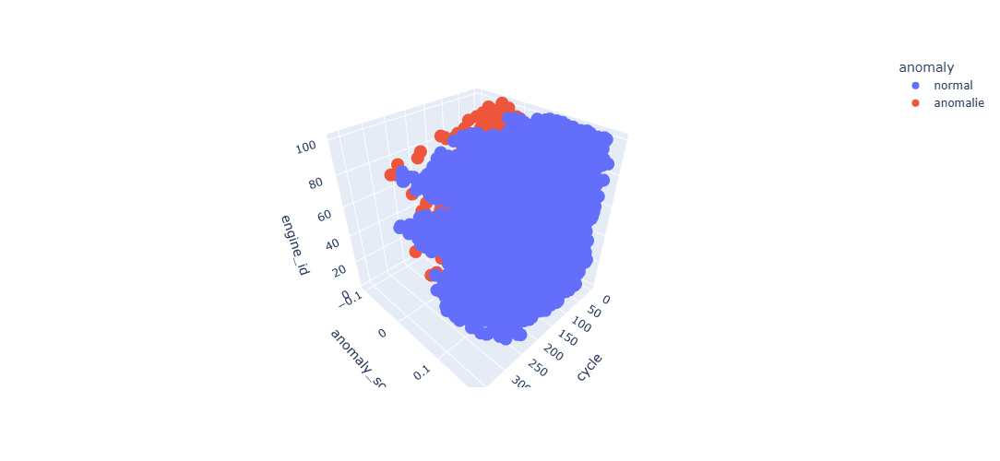

In [66]:
# Pour plusieurs moteurs
fig = px.scatter_3d(data_frame=df,
                    x='cycle',
                    y='anomaly_score',
                    z='engine_id',
                    color='anomaly')
fig.update_layout(width=900, height = 500)
fig.show()

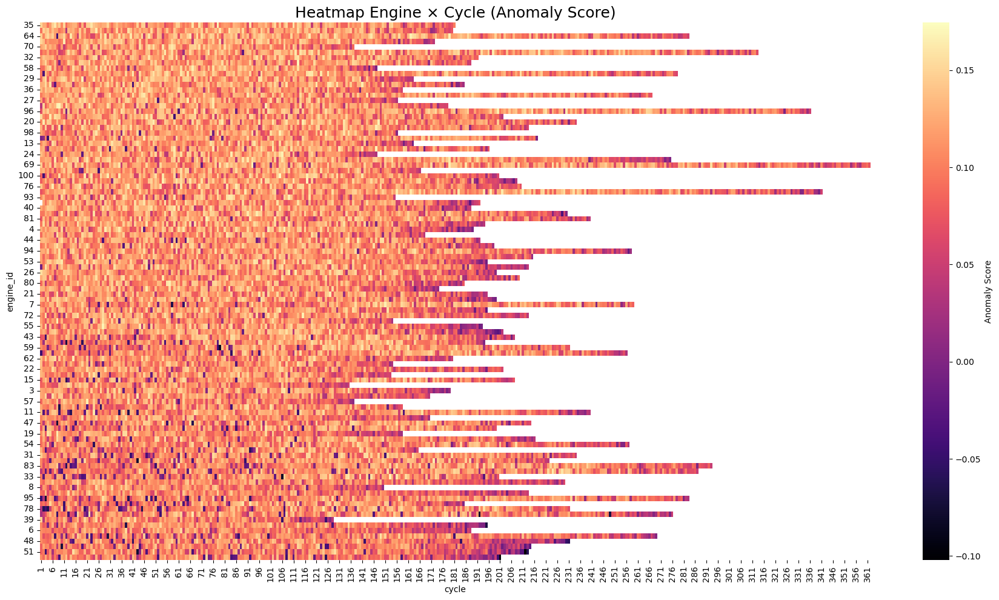

In [52]:
# 1. PIVOT TABLE
# Chaque ligne = un moteur
# Chaque colonne = un cycle
# Valeur = anomaly_score moyen à ce cycle pour ce moteur
pivot = df.pivot_table(
    index="engine_id",
    columns="cycle",
    values="anomaly_score",
    aggfunc="mean"
)

# 2. Trier les moteurs par risque moyen
engine_order = pivot.mean(axis=1).sort_values(ascending=False).index
pivot = pivot.reindex(engine_order)

# 3. Reconstruire la grille complète de cycles
full_cycles = np.arange(df["cycle"].min(), df["cycle"].max() + 1)
pivot = pivot.reindex(columns=full_cycles)

# 4. HEATMAP
plt.figure(figsize=(18, 10))
sns.heatmap(
    pivot,
    cmap="magma",                          # palette continue PRO (peut changer)
    cbar_kws={"label": "Anomaly Score"},   # nom de la barre de couleur
    linewidths=0,
    linecolor='gray'
)
plt.title("Heatmap Engine × Cycle (Anomaly Score)", fontsize=18)
plt.tight_layout()
plt.show()

In [58]:
df['anomaly'] = df['anomaly'].map({"anomalie" : -1, "normal" : 1})
engine_anomaly_count = df.groupby('engine_id')['anomaly'].sum()

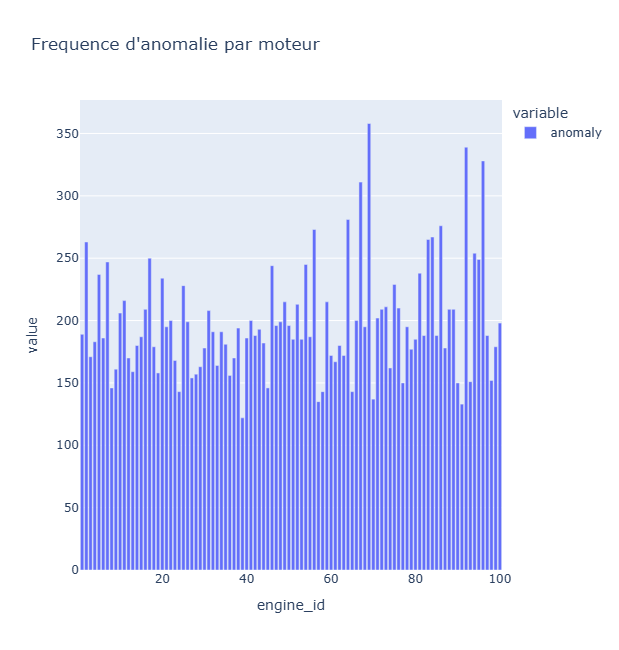

In [75]:
fig = px.bar(engine_anomaly_count,
            title="Frequence d'anomalie par moteur")
fig.update_layout(width=1200, height=650)
fig.show()

In [79]:
engine_anomaly_score_count = df.groupby('engine_id')['anomaly_score'].sum()

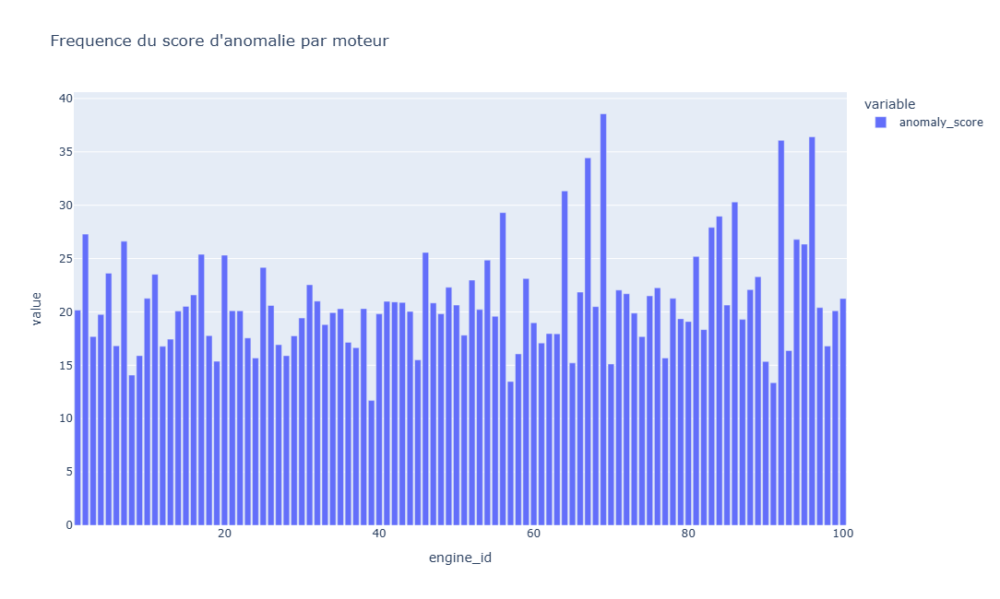

In [80]:
fig = px.bar(engine_anomaly_score_count,
            title="Frequence du score d'anomalie par moteur")
fig.update_layout(width=1200, height=650)
fig.show()